In [151]:
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import datetime
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

from sklearn.metrics import pairwise_distances_argmin_min
from sklearn import metrics

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
#plt.style.use('ggplot')


from itertools import cycle
import networkx as nx


from matplotlib_venn import venn2, venn3, venn3_unweighted
import venn

from lineage import get_lineage_coll, get_lineage_snp
from resistance import get_resistance_snp
from coinfection_functions import import_VCF42_to_pandas, filter_repeats, add_snp_distance, \
                            scatter_vcf_pos, distplot_sns, add_window_distance

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
pd.set_option('display.max_columns', None)

In [5]:
sample_list = []
vcf_files = []
directory = "somoza_gvcf"

for file in os.listdir(directory):
    if file.endswith(".snp.hf.pass.vcf"):
        name = file.split(".")[0]
        sample_list.append(name)
        file_path = os.path.join(directory, file)
        vcf_files.append(file_path)
        
sample_list.sort()
vcf_files.sort()

print(sample_list)
print(vcf_files)

['17152627', '17160843', '17171479', 'SOMOZACOL2', 'SOMOZACOL3']
['somoza_gvcf/17152627.snp.hf.pass.vcf', 'somoza_gvcf/17160843.snp.hf.pass.vcf', 'somoza_gvcf/17171479.snp.hf.pass.vcf', 'somoza_gvcf/SOMOZACOL2.snp.hf.pass.vcf', 'somoza_gvcf/SOMOZACOL3.snp.hf.pass.vcf']


# Import vcf as dataframe

In [153]:
x = datetime.datetime.now()
print(x)
dict_vcf = {}
for vcf, df_name in zip(vcf_files, sample_list):
    dict_vcf[df_name] = import_VCF42_to_pandas(vcf)
y = datetime.datetime.now()
print(y)
print("Done with import in: %s" % (y - x))

2019-06-10 10:50:20.745384
2019-06-10 10:51:18.516163
Done with import in: 0:00:57.770779


In [7]:
dict_vcf[sample_list[2]].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF
0,MTB_anc,2532,.,C,T,115604.99,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.67;DP=24;Exce...,GT:AD:DP:GQ:PL,"1/1:0,24:24:72:738,72,0",2.0,1.0,2.0,1.67,24.0,3.0103,0.000,-0.0000,60.0,0.0,33.51,1.260,0.028,1/1,"0,24",72.0,"738,72,0",NaN,NaN,NaN,2,0.0,24.0,1,1,24.0,0.000000,1.000000
1,MTB_anc,6140,.,G,T,17166.66,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.820e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:53,53:106:99:1423,0,1599",1.0,0.5,2.0,-2.82,106.0,0.2400,4.531,0.3663,60.0,0.0,26.37,0.539,0.564,0/1,"53,53",99.0,"1423,0,1599",NaN,NaN,NaN,2,53.0,53.0,0,1,106.0,0.500000,0.500000
2,MTB_anc,9143,.,C,T,278029.99,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.79;DP=96;Exce...,GT:AD:DP:GQ:PL,"1/1:0,96:96:99:3187,286,0",2.0,1.0,2.0,1.79,96.0,3.0103,0.000,-0.0000,60.0,0.0,34.05,0.467,0.752,1/1,"0,96",99.0,"3187,286,0",NaN,NaN,NaN,2,0.0,96.0,1,1,96.0,0.000000,1.000000
3,MTB_anc,11370,.,C,T,27071.78,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.730e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:67,51:118:99:1189,0,1868",1.0,0.5,2.0,-1.73,118.0,0.0000,0.000,0.8021,60.0,0.0,27.54,1.460,0.752,0/1,"67,51",99.0,"1189,0,1868",NaN,NaN,NaN,2,67.0,51.0,0,1,118.0,0.567797,0.432203
4,MTB_anc,13460,.,G,A,267166.99,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.78;DP=110;Exc...,GT:AD:DP:GQ:PL,"1/1:0,110:110:99:3488,329,0",2.0,1.0,2.0,1.78,110.0,3.0103,0.000,-0.0000,60.0,0.0,33.04,0.919,0.355,1/1,"0,110",99.0,"3488,329,0",NaN,NaN,NaN,2,0.0,110.0,1,1,110.0,0.000000,1.000000


In [8]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF'],
      dtype='object')

# Add repeat and snp distance info

In [9]:
#dict_vcf = {}

for name, vcf_df in dict_vcf.items():
    #Add repeat info (Phage, Transposon or PE/PPE regions)
    vcf_df['Is_repeat'] = vcf_df.apply(filter_repeats, axis=1)

    #Add info of nearby positions
    add_snp_distance(vcf_df)
    
    #Add info of clustered positions in sliding window
    add_window_distance(vcf_df, window_size=10)

In [10]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10'],
      dtype='object')

# Create a set of filtered df in different dictionary

In [32]:
dict_dff = {}
distance = 15
QD = 15
for name, df_vcf in dict_vcf.items():
    list_positions_to_filter = df_vcf['POS'][(
                                (df_vcf.snp_left_distance <= distance)|
                                (df_vcf.snp_right_distance <= distance)|
                                (df_vcf.Window_10 >= 2)|
                                (df_vcf.Is_repeat == True) |
                                (df_vcf.AF <= 0.0) |
                                (df_vcf.len_AD > 2) |
                                (df_vcf.QD <= QD))].tolist()
    dict_dff[name] = df_vcf[~df_vcf.POS.isin(list_positions_to_filter)]

In [33]:
dict_dff[sample_list[2]][dict_dff[sample_list[2]].Is_repeat == True].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10


In [34]:
dict_dff[sample_list[2]][dict_dff[sample_list[2]].snp_left_distance <= 30].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
316,MTB_anc,709226,.,G,A,50246.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.488e+00;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:20,36:56:99:0|1:709206_C_T:1448,0,1893:709206",1.0,0.5,2.0,-2.488,56.0,0.0000,0.0,0.8673,60.0,0.0,34.89,0.102,0.706,0|1,"20,36",99.0,"1448,0,1893",0|1,709206_C_T,709206,2,20.0,36.0,0,1,56.0,0.357143,0.642857,False,19.0,3467.0,1
346,MTB_anc,815851,.,G,A,220726.94,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.76;DP=93;Exce...,GT:AD:DP:GQ:PL,"1/1:0,93:93:99:3151,279,0",2.0,1.0,2.0,1.760,93.0,3.0103,0.0,-0.0000,60.0,0.0,33.90,0.239,0.367,1/1,"0,93",99.0,"3151,279,0",NaN,NaN,NaN,2,0.0,93.0,1,1,93.0,0.000000,1.000000,False,16.0,2801.0,1
366,MTB_anc,885542,.,G,C,62847.91,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.25;DP=79;Exc...,GT:AD:DP:GQ:PL,"0/1:29,50:79:99:1588,0,796",1.0,0.5,2.0,1.250,79.0,0.0000,0.0,0.8721,60.0,0.0,32.66,1.440,0.783,0/1,"29,50",99.0,"1588,0,796",NaN,NaN,NaN,2,29.0,50.0,0,1,79.0,0.367089,0.632911,False,24.0,6214.0,1
454,MTB_anc,1107940,.,C,A,130974.03,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.75;DP=115;Exc...,GT:AD:DP:GQ:PGT:PID:PL:PS,"1|1:0,115:115:99:1|1:1107917_G_T:4382,347,0:11...",2.0,1.0,2.0,1.750,115.0,0.0234,0.0,0.9999,60.0,0.0,33.71,1.210,0.322,1|1,"0,115",99.0,"4382,347,0",1|1,1107917_G_T,1107917,2,0.0,115.0,1,1,115.0,0.000000,1.000000,False,23.0,1223.0,1
501,MTB_anc,1250357,.,G,T,240530.99,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.78;DP=89;Exce...,GT:AD:DP:GQ:PL,"1/1:0,89:89:99:2836,266,0",2.0,1.0,2.0,1.780,89.0,3.0103,0.0,-0.0000,60.0,0.0,33.85,0.207,0.692,1/1,"0,89",99.0,"2836,266,0",NaN,NaN,NaN,2,0.0,89.0,1,1,89.0,0.000000,1.000000,False,17.0,754.0,1


In [35]:
print(dict_dff.keys())

dict_keys(['17152627', '17160843', '17171479', 'SOMOZACOL2', 'SOMOZACOL3'])


In [39]:
check=dict_dff['17152627']
check[check.AF < 0.3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
410,MTB_anc,983485,.,T,G,20971.78,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.93;DP=39;Exc...,GT:AD:DP:GQ:PL,"0/1:28,11:39:99:369,0,881",1.0,0.5,2.0,2.930,39.0,0.0000,0.744,0.8021,60.00,0.000,31.07,-0.856,0.695,0/1,"28,11",99.0,"369,0,881",NaN,NaN,NaN,2,28.0,11.0,0,1,39.0,0.717949,0.282051,False,1815.0,2136.0,1
585,MTB_anc,1473252,.,T,C,4198.15,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-7.600e-02;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:39,3:42:39:0|1:1473247_C_A:39,0,1944:1473247",1.0,0.5,2.0,-0.076,42.0,3.1527,5.646,-0.0330,59.92,0.000,15.16,-1.296,0.909,0|1,"39,3",39.0,"39,0,1944",0|1,1473247_C_A,1473247,2,39.0,3.0,0,1,42.0,0.928571,0.071429,False,86.0,4336.0,1
606,MTB_anc,1480972,.,T,C,129152.78,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.51;DP=97;Exc...,GT:AD:DP:GQ:PL,"0/1:69,28:97:99:705,0,1832",1.0,0.5,2.0,2.510,97.0,0.7111,4.860,0.1481,60.00,0.000,20.70,1.310,0.389,0/1,"69,28",99.0,"705,0,1832",NaN,NaN,NaN,2,69.0,28.0,0,1,97.0,0.711340,0.288660,False,24.0,213.0,1
1093,MTB_anc,2866607,.,G,A,177457.27,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.663e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:105,25:130:99:433,0,3488",1.0,0.5,2.0,-3.663,130.0,6.4958,0.745,-0.1463,55.97,-8.065,26.04,0.706,0.590,0/1,"105,25",99.0,"433,0,3488",NaN,NaN,NaN,2,105.0,25.0,0,1,130.0,0.807692,0.192308,False,27.0,40.0,1
1094,MTB_anc,2866647,.,G,A,154050.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.640e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:115,25:140:99:475,0,3498",1.0,0.5,2.0,-0.264,140.0,6.4958,5.593,-0.1463,55.12,-6.783,25.53,1.030,1.225,0/1,"115,25",99.0,"475,0,3498",NaN,NaN,NaN,2,115.0,25.0,0,1,140.0,0.821429,0.178571,False,40.0,24.0,1
1100,MTB_anc,2866772,.,A,C,103515.96,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=5.51;DP=110;Ex...,GT:AD:DP:GQ:PL,"0/1:99,11:110:99:158,0,4208",1.0,0.5,2.0,5.510,110.0,4.8419,3.674,-0.1059,51.13,-9.883,31.34,-0.967,0.997,0/1,"99,11",99.0,"158,0,4208",NaN,NaN,NaN,2,99.0,11.0,0,1,110.0,0.900000,0.100000,False,23.0,33.0,1
1116,MTB_anc,2867207,.,C,G,78544.26,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.80;DP=88;Exc...,GT:AD:DP:GQ:PL,"0/1:78,10:88:99:140,0,2612",1.0,0.5,2.0,1.800,88.0,2.2494,11.866,0.0180,57.80,-2.673,23.64,-0.084,1.107,0/1,"78,10",99.0,"140,0,2612",NaN,NaN,NaN,2,78.0,10.0,0,1,88.0,0.886364,0.113636,False,325.0,194.0,1
1119,MTB_anc,2867435,.,T,G,80418.85,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=4.34;DP=100;Ex...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:92,8:100:47:0|1:2867401_A_C:47,0,4007:2867401",1.0,0.5,2.0,4.340,100.0,4.7999,17.613,-0.0994,49.85,-10.040,31.70,NaN,1.792,0|1,"92,8",47.0,"47,0,4007",0|1,2867401_A_C,2867401,2,92.0,8.0,0,1,100.0,0.920000,0.080000,False,30.0,1224.0,1
1635,MTB_anc,4223172,.,C,T,67394.91,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.202e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:18,6:24:99:149,0,663",1.0,0.5,2.0,-1.202,24.0,0.0000,0.000,0.8158,60.00,0.000,33.07,-0.970,0.345,0/1,"18,6",99.0,"149,0,663",NaN,NaN,NaN,2,18.0,6.0,0,1,24.0,0.750000,0.250000,False,2998.0,9155.0,1


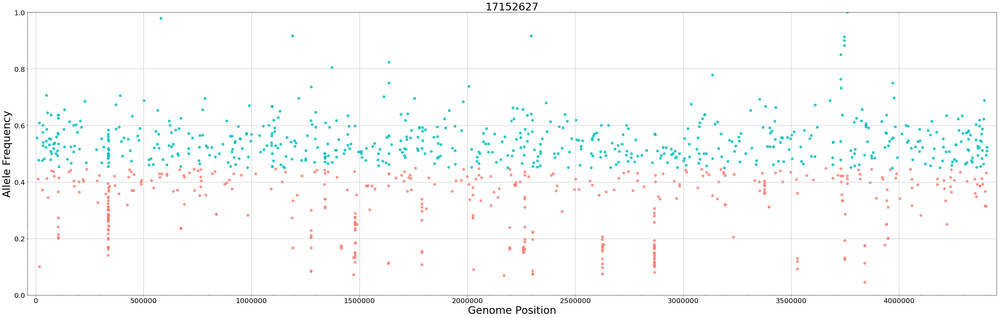

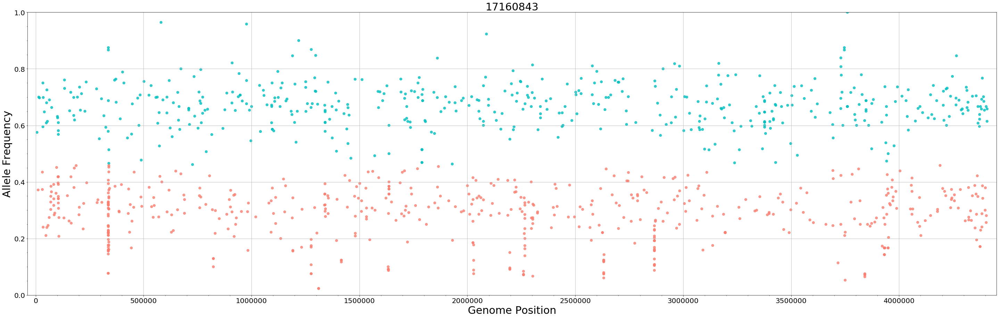

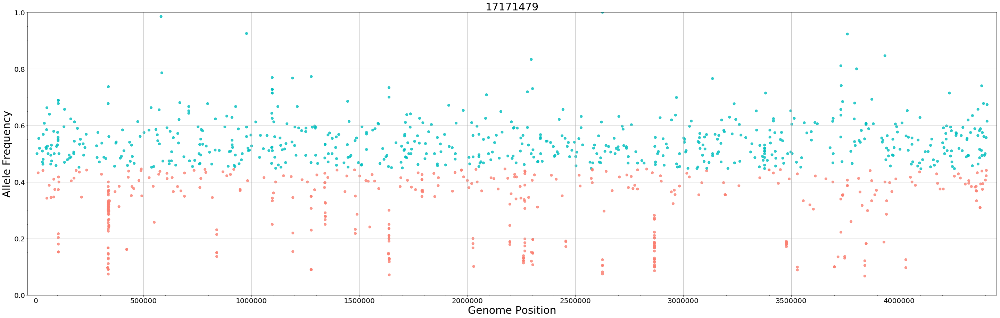

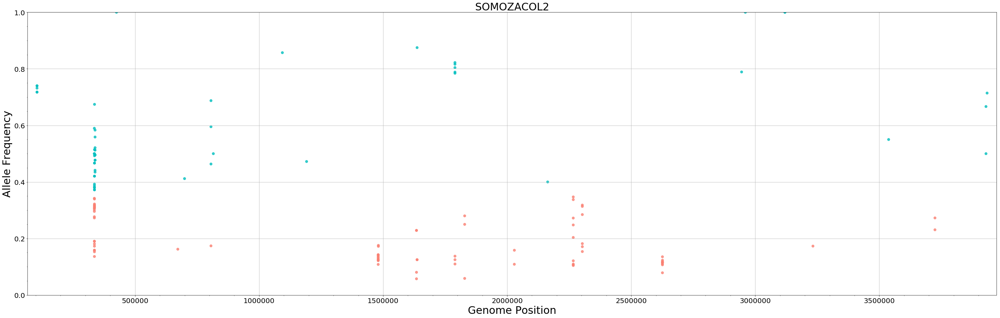

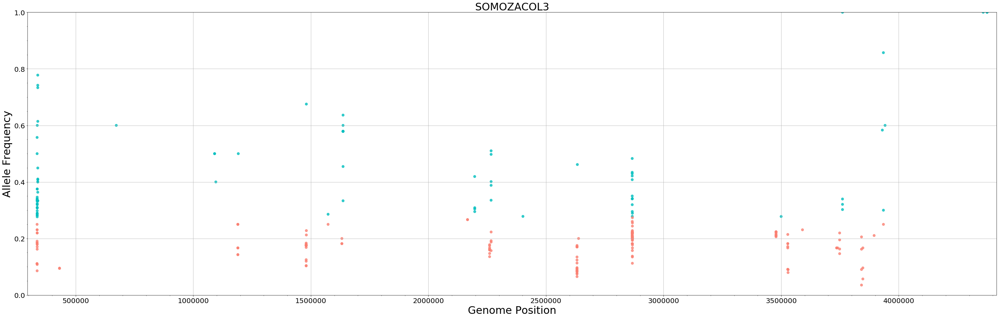

In [22]:
for name_dsf, df in dict_vcf.items():
    scatter_vcf_pos(df,name_dsf)

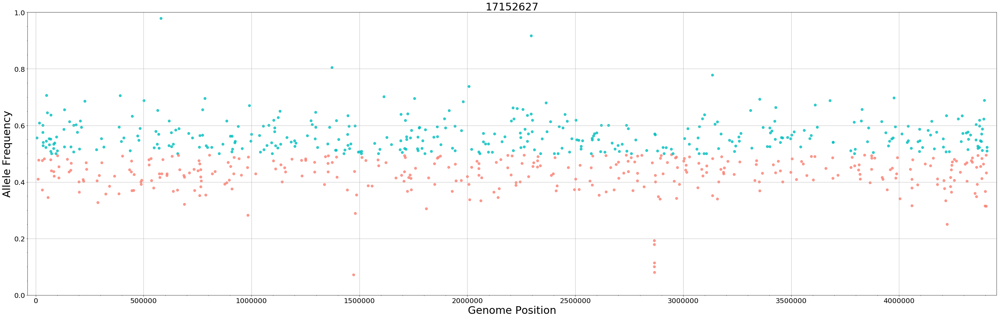

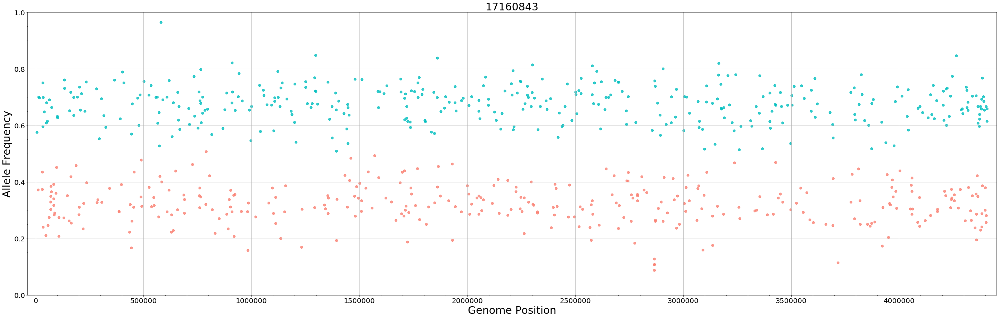

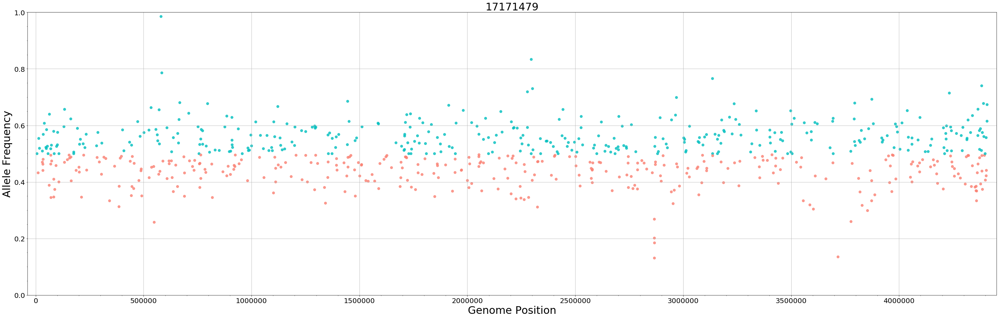

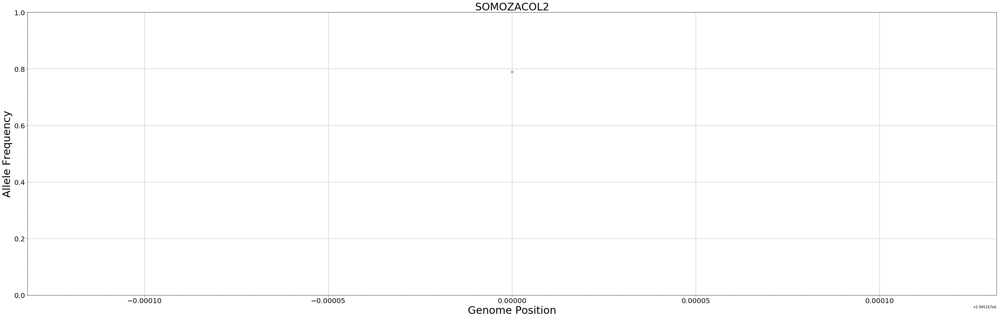

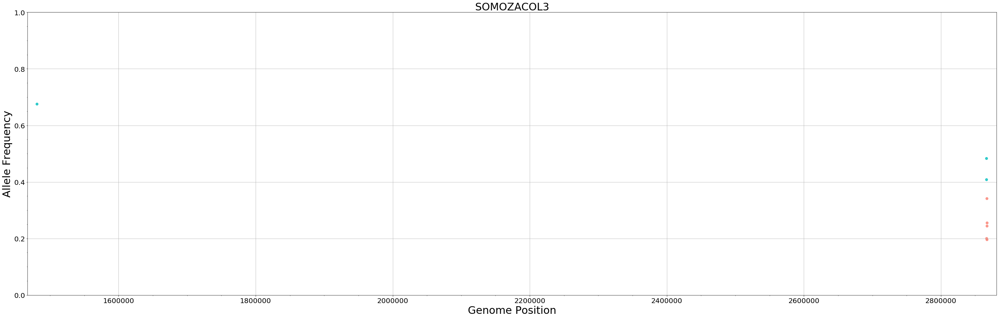

In [38]:
for name_dsf, df in dict_dff.items():
    scatter_vcf_pos(df,name_dsf)

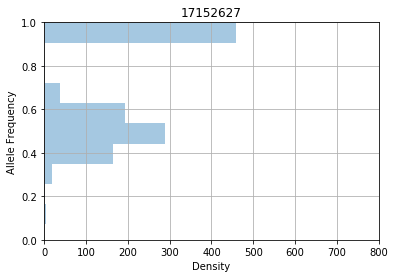

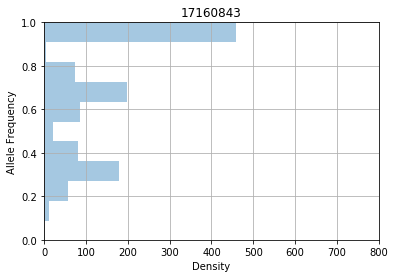

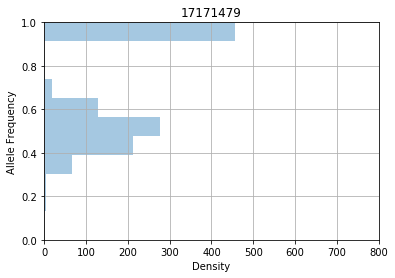

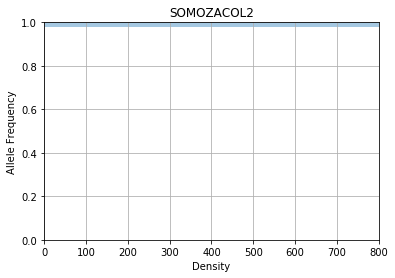

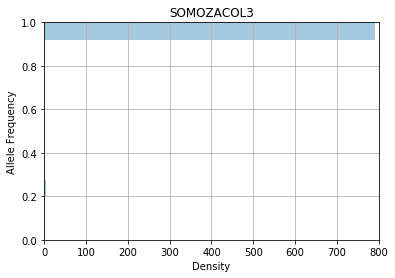

In [40]:
for name_dsf, df in dict_dff.items():
    distplot_sns(df,name_dsf)

In [41]:
def split_df_mean(vcf_df, homoz=0.95):
    filter_homoz_top = homoz
    filter_homoz_bottom = (1 - filter_homoz_top)
    
    #mean = vcf_df['AF'][(vcf_df['AF'] <= filter_homoz_top) & (vcf_df['AF'] >= filter_homoz_bottom)].mean(axis = 0)
    mean = vcf_df['AF'][(vcf_df.AC != 2) & (vcf_df.gt0 != 1)].mean(axis = 0)    


    top_positions = vcf_df['POS'][(vcf_df['AF'] >= mean) & (vcf_df.AC != 2) & (vcf_df.gt0 != 1)].tolist()
    bottom_positions = vcf_df['POS'][(vcf_df['AF'] < mean)].tolist()
    
    return top_positions, bottom_positions

In [42]:
dict_t_b = {}
for name_dff, df_dff in dict_dff.items():
    name_top = name_dff + "_t"
    name_btm = name_dff + "_b"
    name_top , name_btm = split_df_mean(df_dff)
    dict_t_b[name_dff] = name_top , name_btm

In [43]:
for k,v in dict_t_b.items():
    print(k,len(v[0]), len(v[1]))

17152627 371 347
17160843 377 339
17171479 364 353
SOMOZACOL2 1 0
SOMOZACOL3 3 5


# Create sets for comparing

In [44]:
S2 = set(dict_dff['SOMOZACOL2'].POS.values)
S3 = set(dict_dff['SOMOZACOL3'].POS.values)

In [45]:
S3_exclusive = S3 - S2
S2_exclusive = S2 - S3
Shared_2_3 = S2 & S3
total_difference_2_3 = (len(S2_exclusive) + len(S3_exclusive))
print("S2 has %s unique positions\n\
S3 has %s unique positions\n\
Both share %s positions\n\
Total difference: %s" % (len(S2_exclusive) , len(S3_exclusive), len(Shared_2_3),total_difference_2_3 ))

S2 has 387 unique positions
S3 has 347 unique positions
Both share 451 positions
Total difference: 734


# Use venn diagram to check disgregation

<Figure size 1440x720 with 0 Axes>

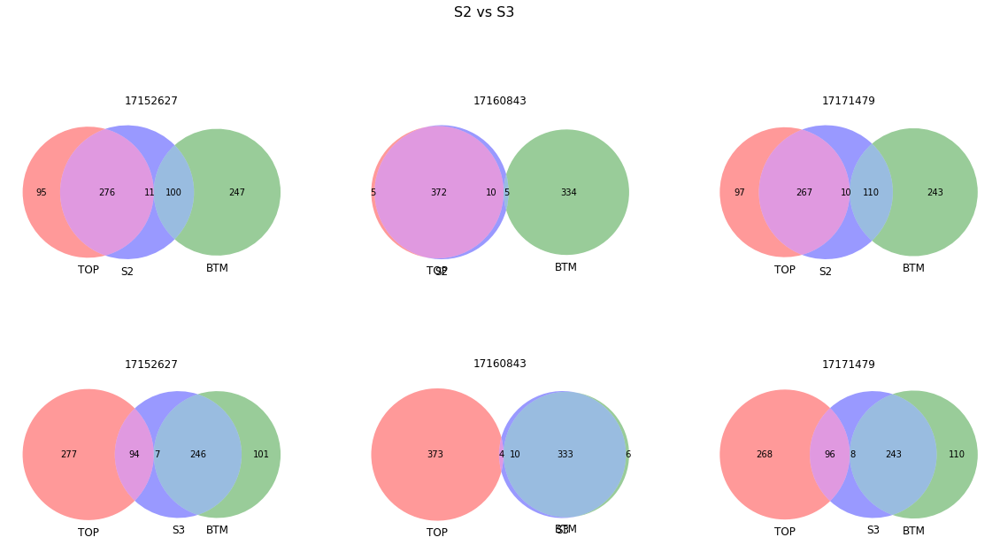

In [46]:
plt.figure(figsize=(20,10))

plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

<Figure size 1440x720 with 0 Axes>

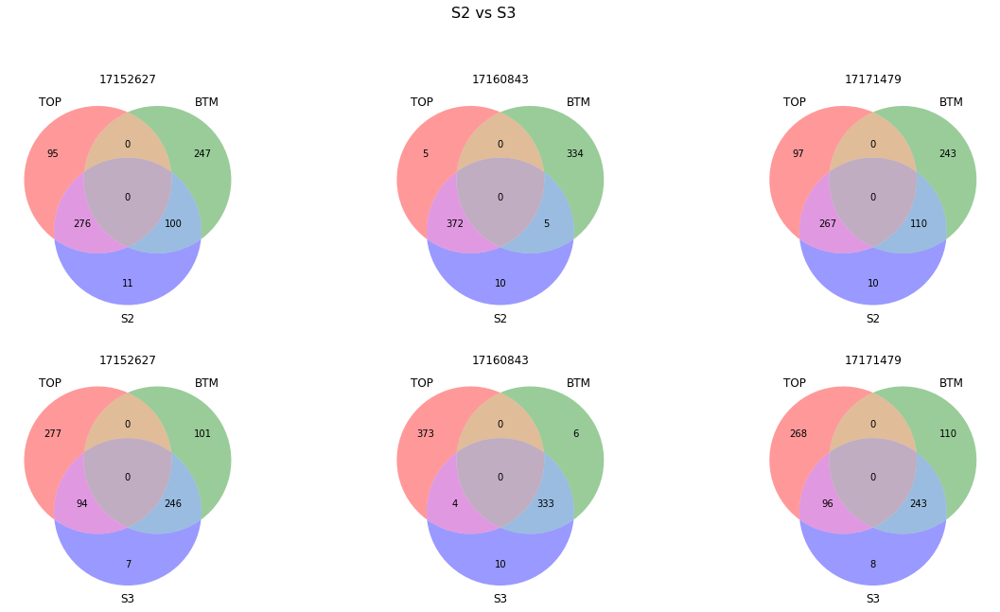

In [47]:
plt.figure(figsize=(20,10))

plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3_unweighted([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3_unweighted([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3_unweighted([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3_unweighted([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3_unweighted([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3_unweighted([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

# Start K-means clustering

### Thanks to: http://www.aprendemachinelearning.com/k-means-en-python-paso-a-paso/

In [48]:
dict_dff[sample_list[2]].describe()

,POS,QUAL,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GQ,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,snp_left_distance,snp_right_distance,Window_10
count,1.173000e+03,1173.000000,1173.000000,1173.000000,1173.0,1116.000000,1173.000000,1173.000000,1173.000000,1173.000000,1116.000000,1173.000000,1116.000000,1173.000000,1173.000000,1173.0,1173.000000,1173.000000,1173.000000,1173.0,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.0
mean,2.216293e+06,97442.241083,1.388747,0.694373,2.0,0.139104,84.938619,0.844621,1.040681,59.830017,0.004007,29.348585,0.244181,0.633038,98.759591,2.0,26.222506,58.705030,0.388747,1.0,84.927536,0.306486,0.693514,3256.793691,3271.619778,1.0
std,1.323415e+06,92021.367712,0.487674,0.243837,0.0,2.372711,22.721372,1.336793,2.379464,1.290904,0.583647,4.540598,0.789752,0.265413,3.432206,0.0,24.195325,26.982802,0.487674,0.0,22.720907,0.253448,0.253448,3383.564802,3401.106752,0.0
min,2.532000e+03,2436.260000,1.000000,0.500000,2.0,-5.521000,6.000000,0.000000,0.000000,41.570000,-9.883000,15.050000,-2.326000,0.008000,24.000000,2.0,0.000000,3.000000,0.000000,1.0,6.000000,0.000000,0.130841,16.000000,16.000000,1.0
25%,1.080528e+06,19949.780000,1.000000,0.500000,2.0,-2.032250,71.000000,0.000000,0.000000,60.000000,0.000000,27.380000,-0.279250,0.479000,99.000000,2.0,0.000000,38.000000,0.000000,1.0,71.000000,0.000000,0.482353,837.000000,853.000000,1.0
50%,2.211971e+06,64332.910000,1.000000,0.500000,2.0,1.125000,85.000000,0.023400,0.000000,60.000000,0.000000,30.140000,0.259000,0.661000,99.000000,2.0,31.000000,51.000000,0.000000,1.0,85.000000,0.425000,0.575000,2225.000000,2210.000000,1.0
75%,3.332254e+06,165600.980000,2.000000,1.000000,2.0,1.782500,98.000000,3.010300,1.291000,60.000000,0.000000,33.000000,0.797750,0.790000,99.000000,2.0,45.000000,79.000000,1.000000,1.0,98.000000,0.517647,1.000000,4474.000000,4474.000000,1.0
max,4.408156e+06,399206.990000,2.000000,1.000000,2.0,5.700000,289.000000,7.400200,30.372000,60.000000,5.480000,37.940000,3.430000,1.758000,99.000000,2.0,250.000000,209.000000,1.000000,1.0,289.000000,0.869159,1.000000,27856.000000,27856.000000,1.0


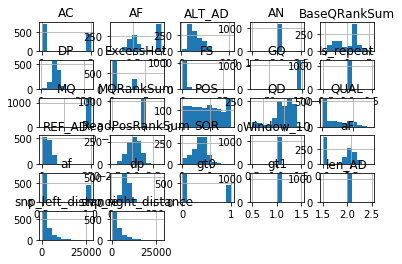

In [50]:
dict_dff[sample_list[2]].hist()
plt.show()

In [51]:
def assign_group_somoza(row):
    if row.POS in S2_exclusive:
        return 1
    elif row.POS in S3_exclusive:
        return 2
    else:
        return 3


In [52]:
print(dict_dff.keys())

dict_keys(['17152627', '17160843', '17171479', 'SOMOZACOL2', 'SOMOZACOL3'])


In [53]:
Ktest15 = dict_dff['17152627'][(dict_dff['17152627'].AC != 2) & (dict_dff['17152627'].gt0 != 1)]
Ktest16 = dict_dff['17160843'][(dict_dff['17160843'].AC != 2) & (dict_dff['17160843'].gt0 != 1)]
Ktest17 = dict_dff['17171479'][(dict_dff['17171479'].AC != 2) & (dict_dff['17171479'].gt0 != 1)]



In [54]:
Ktest15.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
1,MTB_anc,6140,.,G,T,17166.66,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.820e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:32,40:72:99:1222,0,1083",1.0,0.5,2.0,-2.820,72.0,0.24,4.531,0.3663,60.0,0.0,26.37,0.539,0.564,0/1,"32,40",99.0,"1222,0,1083",NaN,NaN,NaN,2,32.0,40.0,0,1,72.0,0.444444,0.555556,False,3608.0,3003.0,1
3,MTB_anc,11370,.,C,T,27071.78,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.730e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:49,34:83:99:857,0,1593",1.0,0.5,2.0,-1.730,83.0,0.00,0.000,0.8021,60.0,0.0,27.54,1.460,0.752,0/1,"49,34",99.0,"857,0,1593",NaN,NaN,NaN,2,49.0,34.0,0,1,83.0,0.590361,0.409639,False,2227.0,2090.0,1
5,MTB_anc,14251,.,G,A,61824.95,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.253e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:34,31:65:99:805,0,1057",1.0,0.5,2.0,-1.253,65.0,0.00,5.868,0.8719,60.0,0.0,30.80,0.112,1.381,0/1,"34,31",99.0,"805,0,1057",NaN,NaN,NaN,2,34.0,31.0,0,1,65.0,0.523077,0.476923,False,791.0,150.0,1
8,MTB_anc,17608,.,G,C,48475.99,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.060e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:29,45:74:99:1198,0,855",1.0,0.5,2.0,-1.060,74.0,0.00,1.169,0.8599,60.0,0.0,30.84,0.000,0.451,0/1,"29,45",99.0,"1198,0,855",NaN,NaN,NaN,2,29.0,45.0,0,1,74.0,0.391892,0.608108,False,2491.0,284.0,1
13,MTB_anc,30943,.,C,T,18500.78,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.039e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:44,26:70:99:520,0,1313",1.0,0.5,2.0,-2.039,70.0,0.00,0.684,0.8021,60.0,0.0,24.67,-0.196,0.794,0/1,"44,26",99.0,"520,0,1313",NaN,NaN,NaN,2,44.0,26.0,0,1,70.0,0.628571,0.371429,False,3474.0,134.0,1


In [55]:
Ktest15['category'] = Ktest15.apply(assign_group_somoza, axis=1)
Ktest16['category'] = Ktest16.apply(assign_group_somoza, axis=1)
Ktest17['category'] = Ktest17.apply(assign_group_somoza, axis=1)


/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http:

In [56]:
Ktest15[Ktest15.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
270,MTB_anc,580772,.,T,A,185279.94,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.053;DP=46;Ex...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:1,45:46:99:0|1:580772_T_A:1839,0,143:580772",1.0,0.5,2.0,0.053,46.0,7.4002,0.000,-0.1658,58.79,0.0,27.87,0.224,0.855,0|1,"1,45",99.0,"1839,0,143",0|1,580772_T_A,580772,2,1.0,45.0,0,1,46.0,0.021739,0.978261,False,5093.0,3399.0,1,3
585,MTB_anc,1473252,.,T,C,4198.15,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-7.600e-02;DP=...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:39,3:42:39:0|1:1473247_C_A:39,0,1944:1473247",1.0,0.5,2.0,-0.076,42.0,3.1527,5.646,-0.0330,59.92,0.0,15.16,-1.296,0.909,0|1,"39,3",39.0,"39,0,1944",0|1,1473247_C_A,1473247,2,39.0,3.0,0,1,42.0,0.928571,0.071429,False,86.0,4336.0,1,3


In [57]:
Ktest15 = Ktest15[Ktest15.category != 3]
Ktest16 = Ktest16[Ktest16.category != 3]
Ktest17 = Ktest17[Ktest17.category != 3]


In [58]:
Ktest15.gt0[Ktest15.category == 1].value_counts()

0    376
Name: gt0, dtype: int64

In [68]:
Ktest15.isnull().any()

#CHROM                False
POS                   False
ID                    False
REF                   False
ALT                   False
QUAL                  False
FILTER                False
INFO                  False
FORMAT                False
sample                False
AC                    False
af                    False
AN                    False
BaseQRankSum          False
DP                    False
ExcessHet             False
FS                    False
InbreedingCoeff       False
MQ                    False
MQRankSum             False
QD                    False
ReadPosRankSum         True
SOR                   False
GT                    False
AD                    False
GQ                    False
PL                    False
PGT                    True
PID                    True
PS                     True
len_AD                False
REF_AD                False
ALT_AD                False
gt0                   False
gt1                   False
dp                  

/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


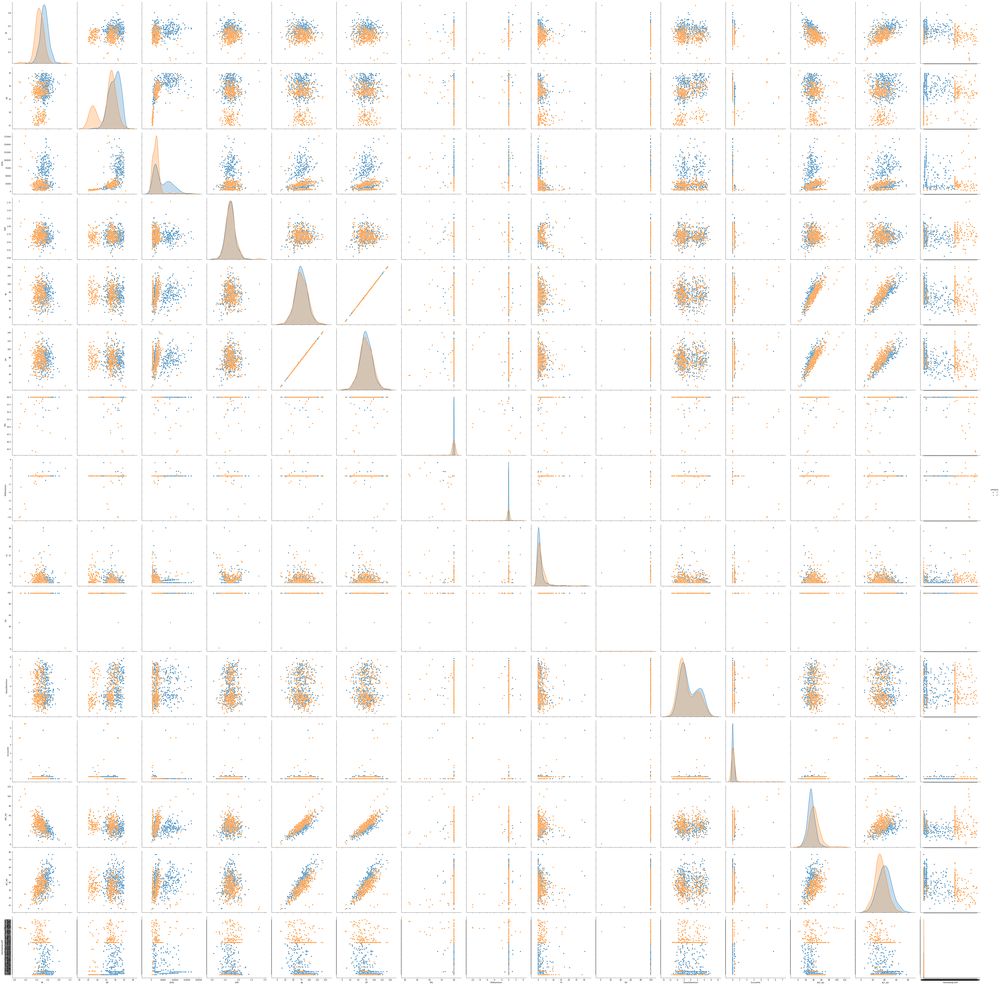

In [139]:
sns.pairplot(Ktest15, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "InbreedingCoeff"],kind='scatter')

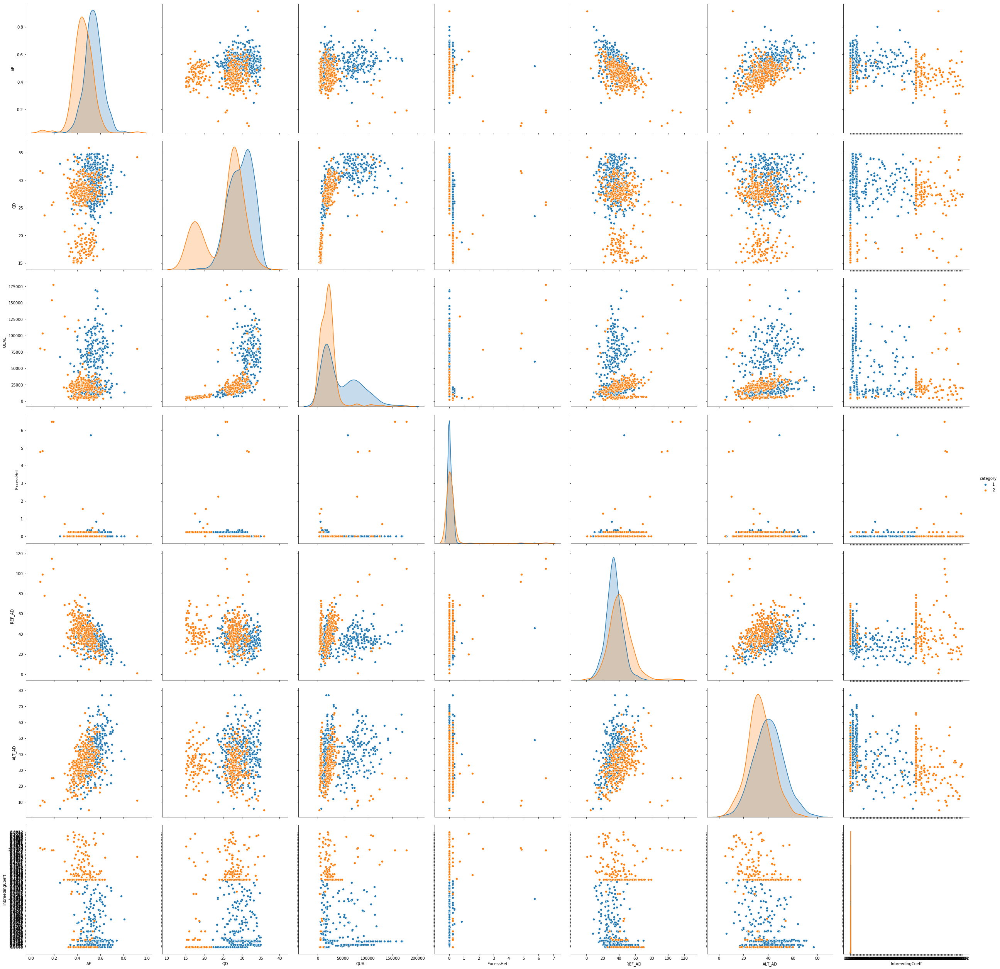

In [140]:
sns.pairplot(Ktest15, hue='category',size=5,vars=["AF","QD", "QUAL", "ExcessHet","REF_AD", "ALT_AD", "InbreedingCoeff"],kind='scatter')

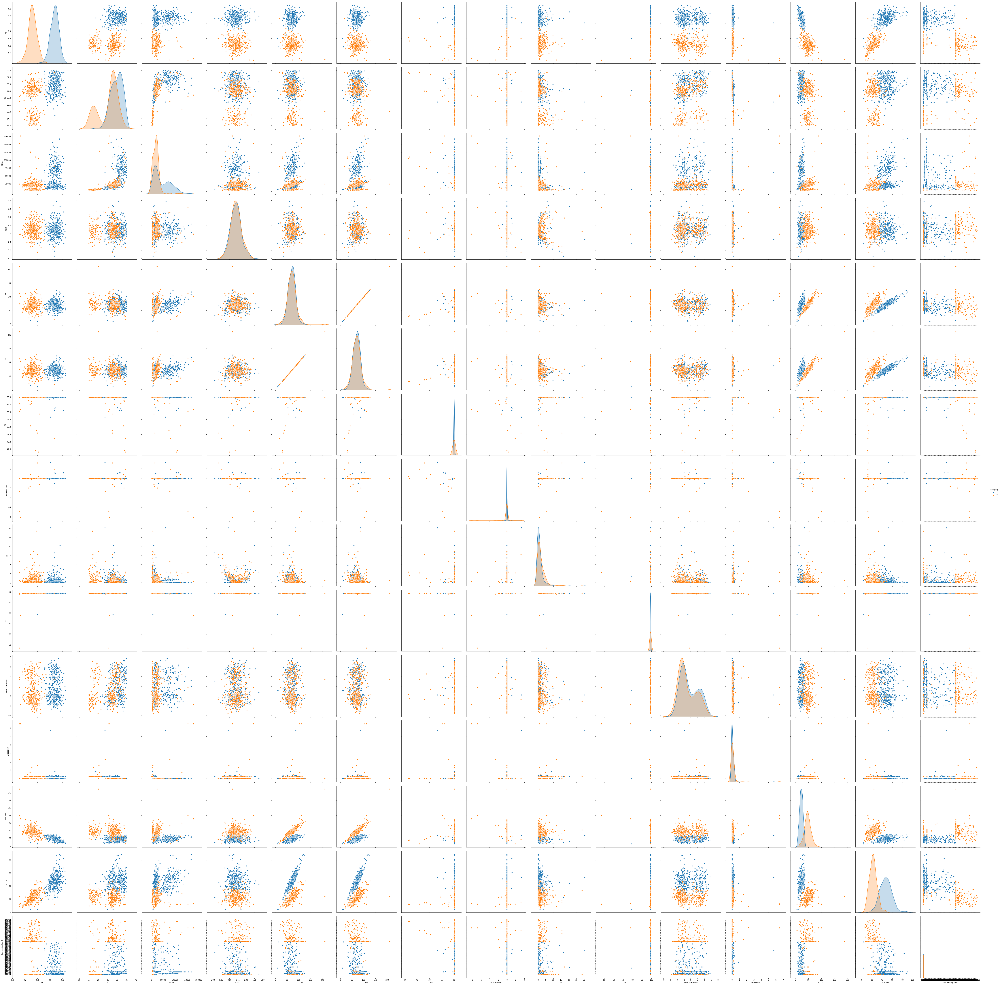

In [141]:
sns.pairplot(Ktest16, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "InbreedingCoeff"],kind='scatter')

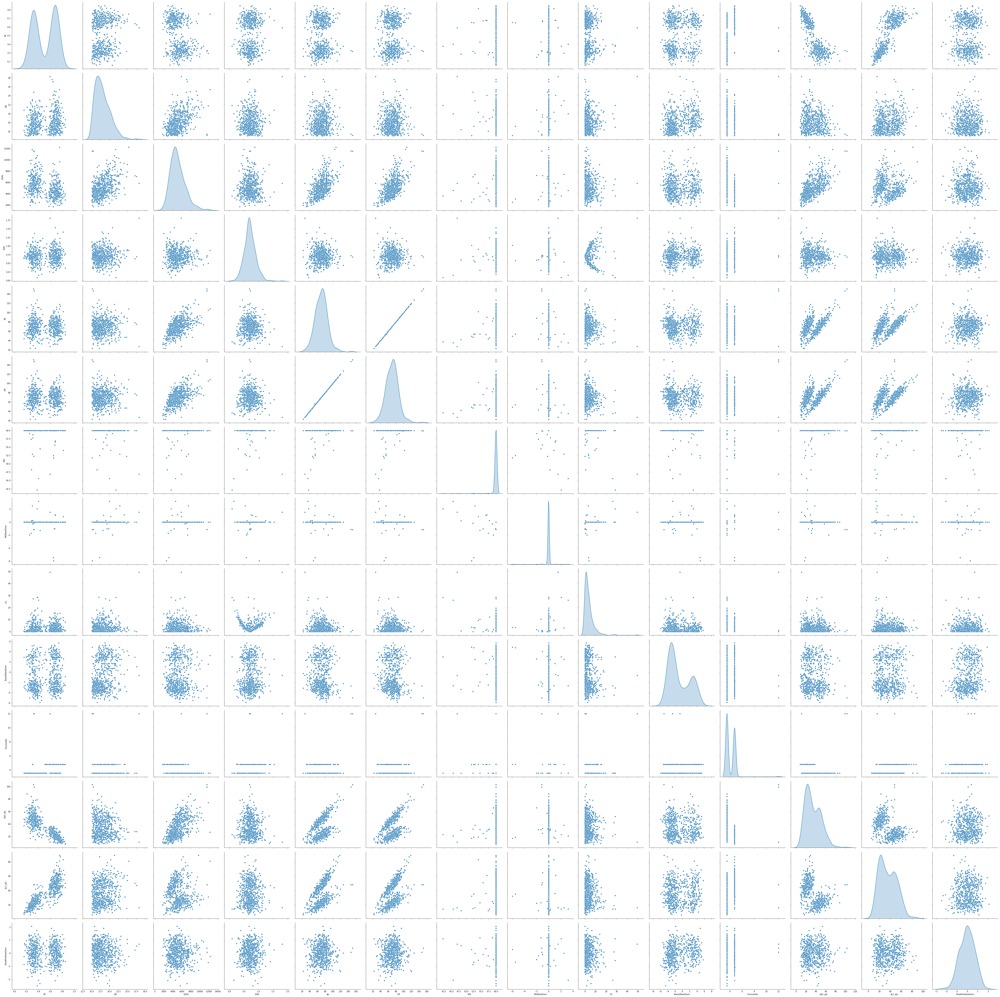

In [212]:
sns.pairplot(Ktest16,size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],diag_kind="kde",kind='scatter')

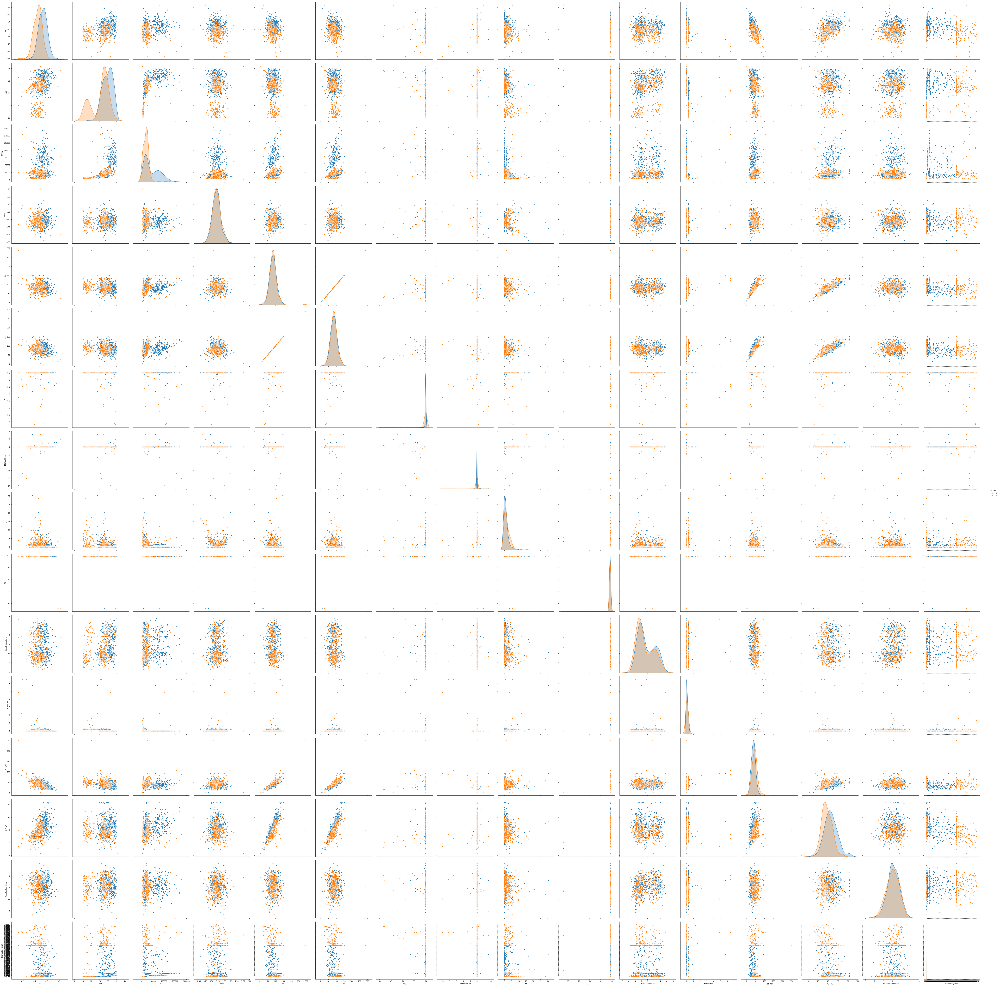

In [142]:
sns.pairplot(Ktest17, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum", "InbreedingCoeff"],kind='scatter')

In [145]:
X = np.array(Ktest15[["AF","QUAL","InbreedingCoeff", "ALT_AD", "QD"]])
y = np.array(Ktest15['category'])
X.shape

(716, 5)

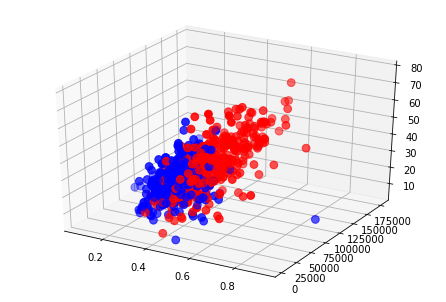

In [147]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y:
    assign.append(colors[row - 1])
ax.scatter(X[:, 0], X[:, 1], X[:, 3], c=assign,s=60)

In [92]:
X16 = np.array(Ktest16[["AF","QUAL", "ALT_AD", "QD"]])
y16 = np.array(Ktest16['category'])
X16.shape

(714, 4)

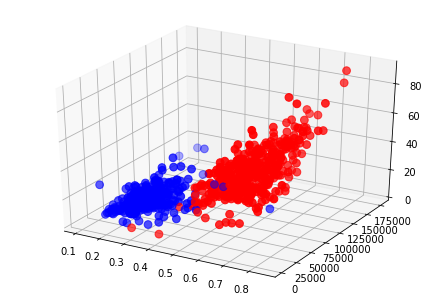

In [93]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y16:
    assign.append(colors[row - 1])
ax.scatter(X16[:, 0], X16[:, 1], X16[:, 2], c=assign,s=60)

In [149]:
X17 = np.array(Ktest17[["AF","QUAL","InbreedingCoeff", "ALT_AD"]])
y17 = np.array(Ktest17['category'])
X17.shape

(716, 4)

In [152]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y17:
    assign.append(colors[row - 1])
ax.scatter(X17[:, 0], X17[:, 1], X17[:, 2], c=assign,s=60)

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fa06ac64158> (for post_execute):


TypeError: can't multiply sequence by non-int of type 'float'

TypeError: can't multiply sequence by non-int of type 'float'

<Figure size 1152x648 with 1 Axes>

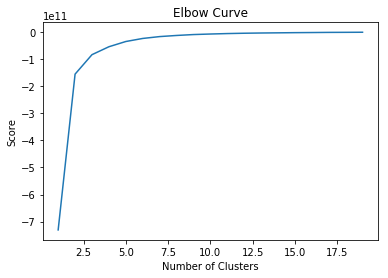

In [96]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [110]:
X = np.array(Ktest15[["QUAL", "ExcessHet","QD"]])
y = np.array(Ktest15['category'])
X = StandardScaler().fit_transform(X)

X

array([[-0.5538731 ,  0.24822373, -0.2776425 ],
       [-0.24375399, -0.23524678, -0.0294415 ],
       [ 0.844332  , -0.23524678,  0.66212711],
       ...,
       [ 0.02697469, -0.23524678,  0.31846418],
       [-0.45036564,  0.24822373, -0.56827103],
       [ 2.05476687, -0.23524678,  1.52764856]])

In [111]:
kmeans = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X)
centroids = kmeans.cluster_centers_
print(centroids)

[[-0.51091516 -0.03837262 -0.30095782]
 [ 1.5101636   0.11342182  0.88957145]]


In [112]:
kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

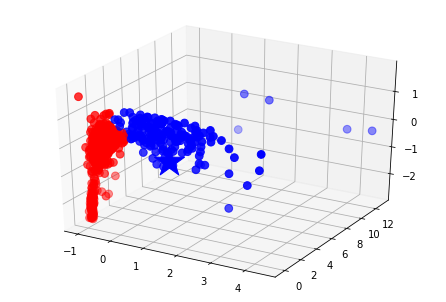

In [113]:
# Predicting the clusters
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)
ax.scatter(C[:, 0], C[:, 1], marker='*', c=colors, s=1000)

In [114]:
Ktest15.columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category'],
      dtype='object')

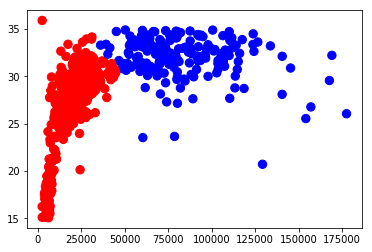

In [117]:
# Getting the values and plotting it
f1 = Ktest15['QUAL'].values
f2 = Ktest15['QD'].values

plt.scatter(f1, f2, c=assign, s=70)
#plt.scatter(C[:, 0], C[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [103]:
X16 = np.array(Ktest16[["AF","QUAL", "ALT_AD", "REF_AD", "QD", "MQ"]])
y16 = np.array(Ktest16['category'])
X16 = StandardScaler().fit_transform(X16)

X16

array([[ 0.35866272, -0.55134666,  0.40100974, -0.21359204, -0.27359907,
         0.13185335],
       [-0.72081417, -0.24008568, -0.41687038,  0.85536624, -0.02498681,
         0.13185335],
       [ 1.01976082,  0.85200664,  0.40100974, -0.98561746,  0.66772768,
         0.13185335],
       ...,
       [-1.20286421,  0.03163981, -0.6685258 ,  1.74616481,  0.32349532,
         0.13185335],
       [ 0.56610381, -0.44745809,  0.96723444, -0.15420547, -0.56470915,
         0.13185335],
       [ 0.79822997,  2.06689834,  1.0301483 , -0.45113832,  1.53468324,
         0.13185335]])

In [104]:
kmeans16 = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X16)
centroids16 = kmeans16.cluster_centers_
print(centroids16)

[[ 0.88321355  0.42359249  0.74003615 -0.70524279  0.47268774 -0.02964414]
 [-0.96609576 -0.4633431  -0.80948236  0.77142393 -0.51704554  0.032426  ]]


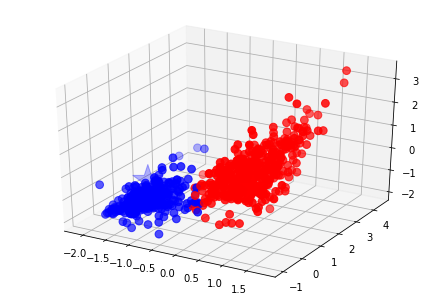

In [105]:
# Predicting the clusters
labels16 = kmeans16.predict(X16)
# Getting the cluster centers
C16 = kmeans16.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels16:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X16[:, 0], X16[:, 1], X16[:, 2], c=assign,s=60)
ax.scatter(C16[:, 0], C16[:, 1], marker='*', c=colors, s=1000)

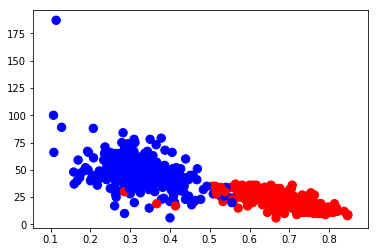

In [106]:
# Getting the values and plotting it
f1 = Ktest16['AF'].values
f2 = Ktest16['REF_AD'].values

plt.scatter(f1, f2, c=assign, s=70)
#plt.scatter(C16[:, 0], C16[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [107]:
copy =  pd.DataFrame()
copy['POS']=Ktest16['POS'].values
copy['AF']=Ktest16['AF'].values
copy['category']=Ktest16['category'].values
copy['label'] = labels16;
Ngrouped =  pd.DataFrame()
Ngrouped['colors']=colors
Ngrouped['N']=copy.groupby('label').size()
Ngrouped

,colors,N
0,red,373
1,blue,341


In [108]:
copy.head()

,POS,AF,category,label
0,6140,0.575342,1,0
1,11370,0.371795,2,1
2,14251,0.700000,1,0
3,17608,0.697368,1,0
4,30943,0.373333,2,1


In [109]:
 #metrics.adjusted_rand_score(labels_true, labels_pred)

# Compute Affinity Propagation

In [118]:
# #############################################################################
# Compute Affinity Propagation
X = X16
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))


Estimated number of clusters: 11
Silhouette Coefficient: 0.477


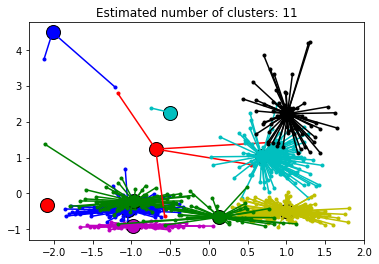

In [119]:

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Compute Agglomerative Clustering

In [120]:
X16 = np.array(Ktest16[["AF", "ALT_AD","QUAL", "QD"]])
X16 = StandardScaler().fit_transform(X16)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X16)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_
Ktest16['Label'] = labels

In [121]:
X15 = np.array(Ktest15[["AF", "ExcessHet","ALT_AD","QUAL", "QD"]])
X15 = StandardScaler().fit_transform(X15)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X15)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_
Ktest15['Label'] = labels

In [122]:
X17 = np.array(Ktest17[["AF", "ExcessHet","ALT_AD","QUAL", "QD"]])
X17 = StandardScaler().fit_transform(X17)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X17)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_
Ktest17['Label'] = labels

<Figure size 1440x720 with 0 Axes>

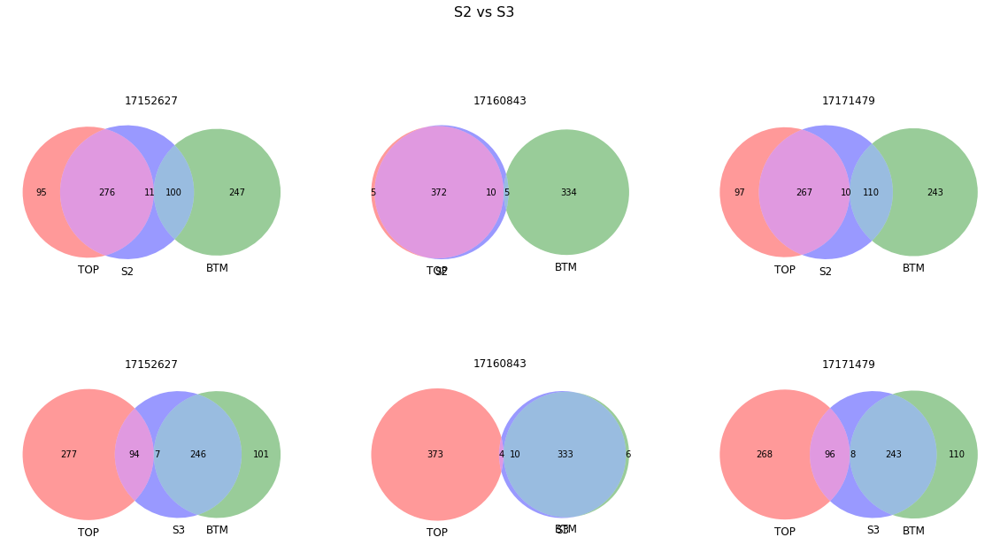

In [124]:
plt.figure(figsize=(20,10))

plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3([set(dict_t_b['17152627'][0]), set(dict_t_b['17152627'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3([set(dict_t_b['17160843'][0]), set(dict_t_b['17160843'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3([set(dict_t_b['17171479'][0]), set(dict_t_b['17171479'][1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

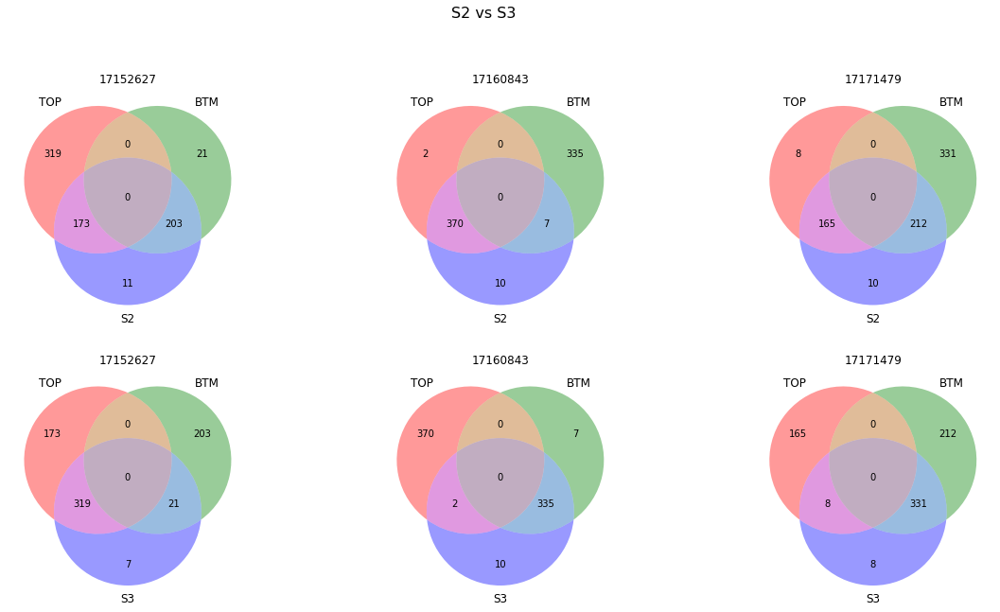

In [125]:
plt.figure(figsize=(20,10))


plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3_unweighted([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3_unweighted([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3_unweighted([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3_unweighted([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3_unweighted([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3_unweighted([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))


#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

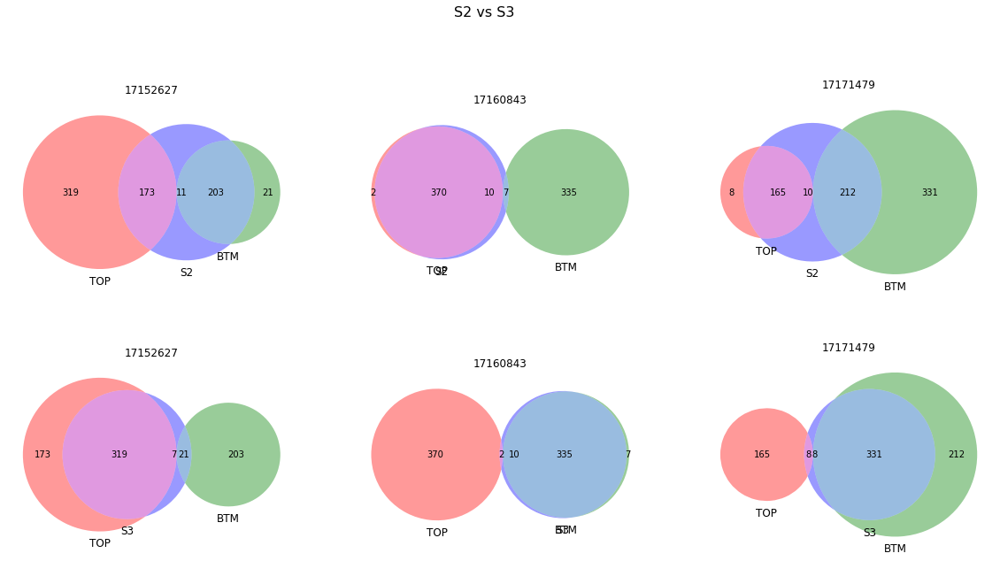

In [126]:
plt.figure(figsize=(20,10))


plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))


#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

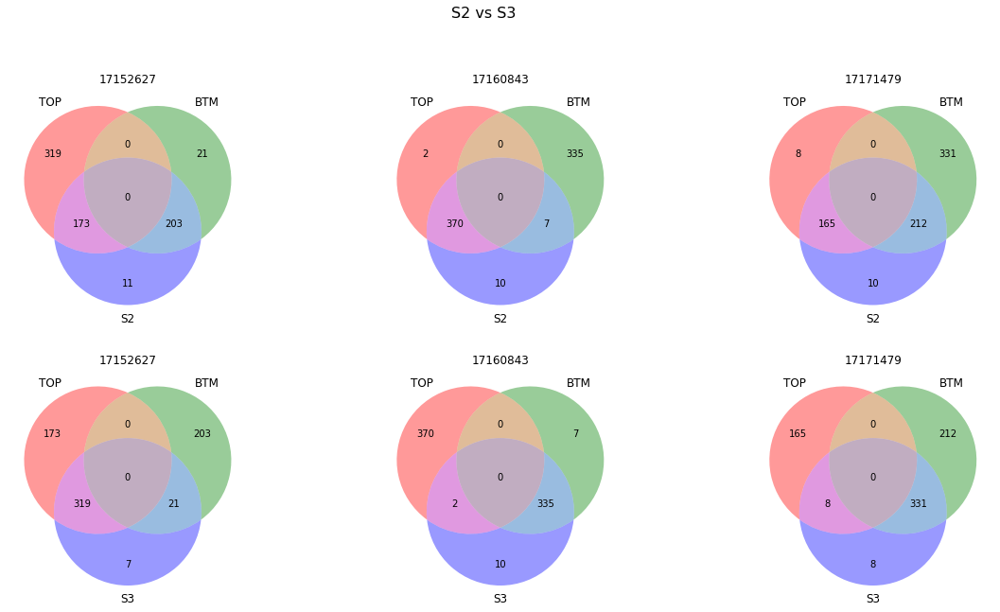

In [127]:
plt.figure(figsize=(20,10))


plt.subplot(2, 3, 1)
plt.title("17152627")
v3 = venn3_unweighted([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 2)
plt.title("17160843")
v3 = venn3_unweighted([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.subplot(2, 3, 3)
plt.title("17171479")
v3 = venn3_unweighted([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S2_exclusive], 
            set_labels = ('TOP', 'BTM', 'S2'))

plt.suptitle('S2 vs S3', fontsize=16, verticalalignment='bottom')



plt.subplot(2, 3, 4)
plt.title("17152627")
v3 = venn3_unweighted([set(Ktest15['POS'][Ktest15.Label == 0]), set(Ktest15['POS'][Ktest15.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 5)
plt.title("17160843")
v3 = venn3_unweighted([set(Ktest16['POS'][Ktest16.Label == 0]), set(Ktest16['POS'][Ktest16.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))

plt.subplot(2, 3, 6)
plt.title("17171479")
v3 = venn3_unweighted([set(Ktest17['POS'][Ktest17.Label == 0]), set(Ktest17['POS'][Ktest17.Label == 1]), S3_exclusive], 
            set_labels = ('TOP', 'BTM', 'S3'))


#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

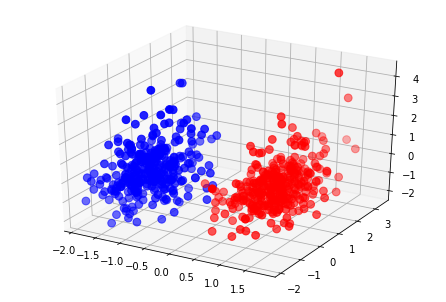

In [182]:
# Predicting the clusters

# Getting the cluster centers
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X16[:, 0], X16[:, 1], X16[:, 2], c=assign,s=60)


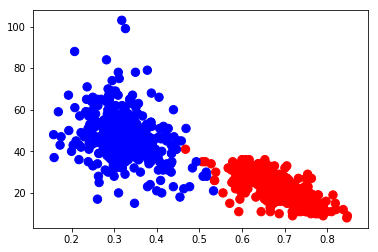

In [183]:
# Getting the values and plotting it
f1 = Ktest16['AF'].values
f2 = Ktest16['REF_AD'].values

colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

plt.scatter(f1, f2, c=assign, s=70)
plt.show()

In [92]:
#corr_PCA_col.append(maxValuesObj, ignore_index=True)

# Feature Selection

https://towardsdatascience.com/feature-selection-techniques-in-machine-learning-with-python-f24e7da3f36e

## 1. Univariate Selection 15

In [72]:
X = Ktest15[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y = Ktest15['category']    #target column i.e price range

In [73]:
X.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD
1,0.555556,26.37,17166.66,0.564,72.0,72.0,60.0,4.531,99.0,0.24,32.0,40.0
3,0.409639,27.54,27071.78,0.752,83.0,83.0,60.0,0.000,99.0,0.00,49.0,34.0
5,0.476923,30.80,61824.95,1.381,65.0,65.0,60.0,5.868,99.0,0.00,34.0,31.0
8,0.608108,30.84,48475.99,0.451,74.0,74.0,60.0,1.169,99.0,0.00,29.0,45.0
13,0.371429,24.67,18500.78,0.794,70.0,70.0,60.0,0.684,99.0,0.00,44.0,26.0


In [74]:
X[X.values < 0]

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD


In [76]:
#apply SelectKBest class to extract top 12 best features
bestfeatures = SelectKBest(score_func=chi2, k=12)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  3.284626e+06
10     REF_AD  2.772464e+02
11     ALT_AD  2.300103e+02
1          QD  1.207859e+02
7          FS  7.072349e+01
9   ExcessHet  5.909099e+00
0          AF  2.906479e+00
5          DP  1.308759e+00
4          dp  1.255639e+00
8          GQ  3.470940e-01
6          MQ  2.856248e-01
3         SOR  6.318531e-02


## 1. Univariate Selection 16

In [77]:
X16 = Ktest16[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y16 = Ktest16['category']    #target column i.e price range

In [78]:
#apply SelectKBest class to extract top 12 best features
bestfeatures16 = SelectKBest(score_func=chi2, k=12)
fit16 = bestfeatures.fit(X16,y16)
dfscores16 = pd.DataFrame(fit16.scores_)
dfcolumns16 = pd.DataFrame(X16.columns)
#concat two dataframes for better visualization 
featureScores16 = pd.concat([dfcolumns16,dfscores16],axis=1)
featureScores16.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores16.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  3.357885e+06
10     REF_AD  3.236893e+03
11     ALT_AD  3.035920e+03
1          QD  1.240578e+02
7          FS  6.292572e+01
0          AF  4.284489e+01
9   ExcessHet  2.118288e+00
4          dp  4.739248e-01
5          DP  4.623506e-01
6          MQ  1.926071e-01
8          GQ  4.991401e-02
3         SOR  1.833065e-02


## 1. Univariate Selection 17

In [79]:
X17 = Ktest17[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y17 = Ktest17['category']    #target column i.e price range

In [80]:
#apply SelectKBest class to extract top 12 best features
bestfeatures17 = SelectKBest(score_func=chi2, k=12)
fit17 = bestfeatures.fit(X17,y17)
dfscores17 = pd.DataFrame(fit17.scores_)
dfcolumns17 = pd.DataFrame(X17.columns)
#concat two dataframes for better visualization 
featureScores17 = pd.concat([dfcolumns17,dfscores17],axis=1)
featureScores17.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores17.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  3.314339e+06
11     ALT_AD  2.917647e+02
10     REF_AD  2.198975e+02
1          QD  1.216185e+02
7          FS  6.449553e+01
9   ExcessHet  3.842906e+00
0          AF  2.659561e+00
4          dp  2.188032e+00
5          DP  2.160060e+00
6          MQ  2.318921e-01
3         SOR  3.963868e-02
8          GQ  2.950816e-04


# 2. Feature Importance

In [132]:
X = Ktest15[["AF",'af', "QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "InbreedingCoeff", 'snp_left_distance', 'snp_right_distance']]  #independent columns
y = Ktest15['category']    #target column i.e price range

In [133]:
Ktest15.columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category',
       'Label'],
      dtype='object')

[0.1336579  0.         0.17744078 0.14259393 0.01938263 0.02412753
 0.02063698 0.01526125 0.03468427 0.00079407 0.09415701 0.05222532
 0.03612551 0.02377378 0.00518043 0.17707959 0.0207117  0.0221673 ]


/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


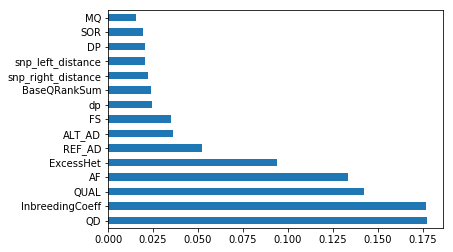

In [134]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [135]:
X = Ktest16[["AF",'af', "QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "InbreedingCoeff", 'snp_left_distance', 'snp_right_distance']]  #independent columns
y = Ktest16['category']    #target column i.e price range

[0.4540925  0.         0.06166015 0.01829334 0.00291146 0.00697875
 0.01496132 0.00369103 0.00332531 0.00206405 0.00780259 0.14661057
 0.22648948 0.00622243 0.00289883 0.03499634 0.00338023 0.00362161]


/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


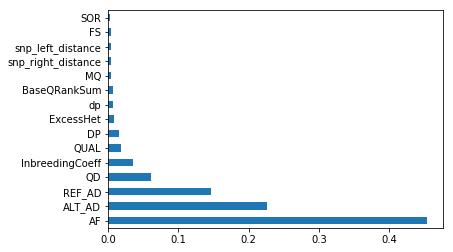

In [136]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [137]:
X = Ktest17[["AF",'af', "QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "InbreedingCoeff", 'snp_left_distance', 'snp_right_distance']]  #independent columns
y = Ktest17['category']    #target column i.e price range

/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[0.07689048 0.         0.16729269 0.14096067 0.01499447 0.02328082
 0.020782   0.0114749  0.02284917 0.00126428 0.09559226 0.04214976
 0.04985259 0.0175727  0.00968477 0.28002024 0.01414385 0.01119436]


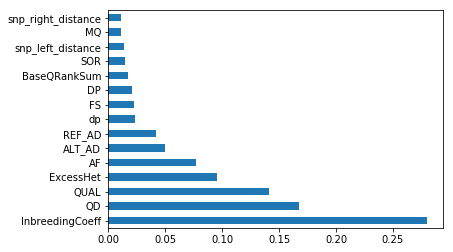

In [138]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()